## Problem Statement:

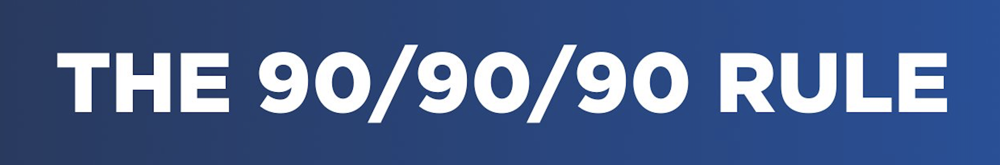

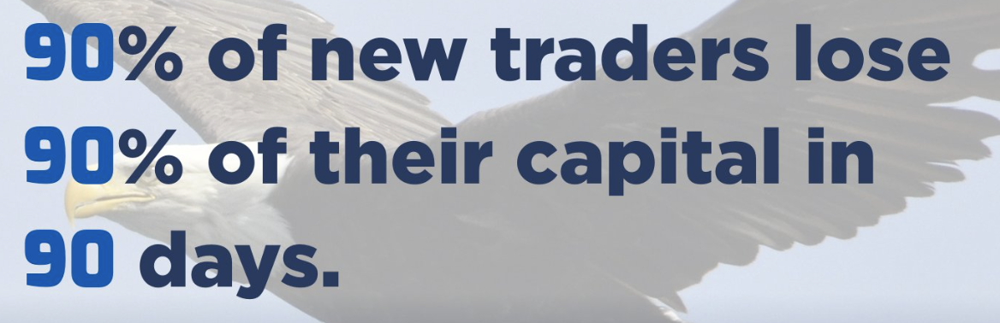

### The Big Question:
- How can we assist retail investors to make better investment decisions by having a marco view on the economy?
- Is that a way that we can predict the Quarterly GDP by using monthly variables such as S&P 500 index, PMI and Non-Farm payrolls 

## 1) Background:
### What is GDP?

- Gross domestic product (GDP) is the total monetary or market value of all the finished goods and services produced within a country's borders in a specific time period. 
- As a broad measure of overall domestic production, it functions as a comprehensive scorecard of a given country’s economic health.

### US GDP

- The U.S. has retained its position of being the world's largest economy since 1871. (see chart below)
- It is often dubbed as an economic superpower and that's because the economy constitutes almost a quarter of the global economy, backed by advanced infrastructure, technology, and an abundance of natural resources.
- To get the real GDP, the Bureau of Economic Analysis (BEA) removes the effects of inflation.

- The 4 major components to calculate U.S. GDP: 
    - Personal consumption expenditures, 
    - Business investment, 
    - Government expenditures and 
    - Net exports
- Consumer spending comprises ~70% of U.S. GDP. Thus retail and service industries are critical components of the U.S. economy.

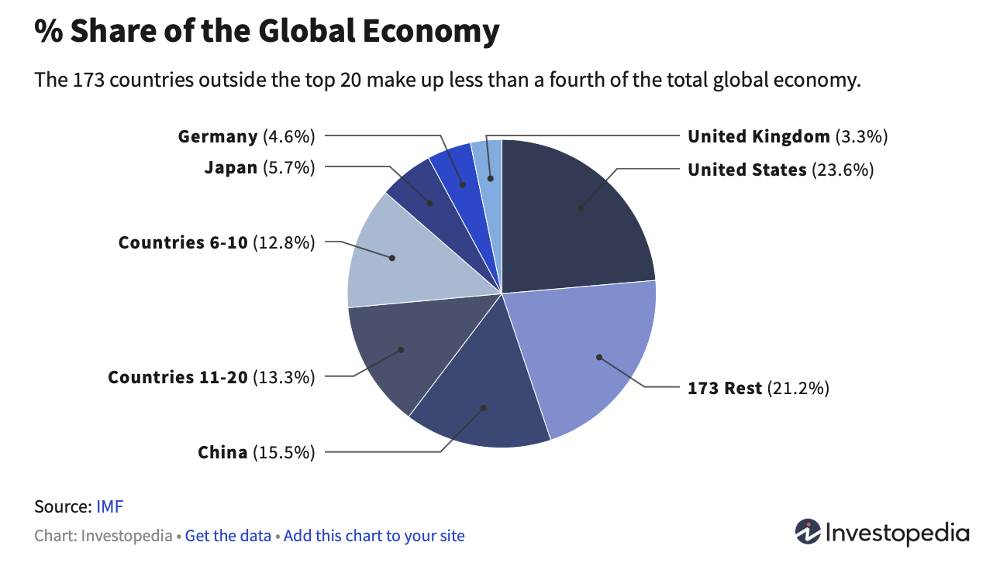

Source: https://www.investopedia.com/insights/worlds-top-economies/

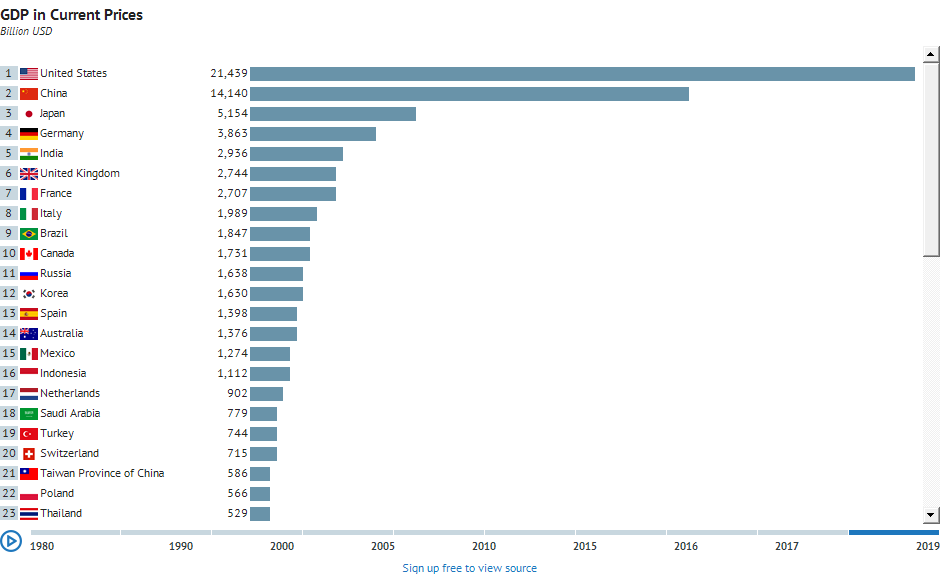

Source: https://knoema.com/nwnfkne/world-gdp-ranking-2019-gdp-by-country-data-and-charts

## 2) Data sources:

| Data                                                     | Frequency |     Source    | Description                                                                                                                                                                                                                                                   |   |
|----------------------------------------------------------|:---------:|:-------------:|---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|---|
| ISM Manufacturing: PMI Composite Index                   |  Monthly  |     Quandl    | ISM measures manufacturing activity based on a monthly survey of purchasing managers at more than 300 manufacturing firms. Significant as it represents 20% of business contribution to GDP in U.S.|   |
| NMI Non-Manufacturing (Services) Index                              |  Monthly  |     Quandl    | An economic index based on surveys of more than 400 non-manufacturing (or services) firms' purchasing and supply executives, within 60 sectors across the nation. Very significant as service sector represents 80% of the U.S. economy.                                                                                               |   |
| Consumer Sentiment                                       |  Monthly  |     Quandl    | The Michigan Consumer Sentiment Index (MCSI) is a monthly survey of U.S. consumer confidence levels conducted by the University of Michigan. It is based on telephone surveys that gather information on consumer expectations regarding the overall economy. |   |
| New Private Housing Units Authorized by Building Permits |  Monthly  |     Quandl    | Measures the change in the number of new building permits issued by the government. A Key indicator of demand in the housing market.                                                                                                                          |   |
| Unemployment Level                                       |  Monthly  |     Quandl    | This statistic displays the seasonally-adjusted unemployment rate in the United States                                                                                                                                                                        |   |
| U.S. Nonfarm Payrolls                                    |  Monthly  |     Quandl    | measures the change in the number of people employed during the previous month, excluding the farming industry.                                                                                                                                               |   |
| Initial Claims                                           |   Weekly  |     Quandl    | measures the number of individuals who filed for unemployment insurance for the first time during the past week.                                                                                                                                              |   |
| Continuing_claims                                        |   Weekly  |     Quandl    | measures the number of unemployed individuals who qualify for benefits under unemployment insurance.                                                                                                                                                          |   |
| AAII Investor Sentiment Data                             |   Weekly  |     Quandl    | The AAII Sentiment Survey is a weekly survey of its members which asks if they are "Bullish," "Bearish," or "Neutral" on the stock market over the next six months.                                                                                           |   |
| S&P500                                                   |   Daily   | Yahoo Finance | The S&P 500 or Standard & Poor's 500 Index is a market-capitalization-weighted index of the 500 largest U.S. publicly traded companies. The index is widely regarded as the best gauge of large-cap U.S. equities.                                            |   |
| VIX                                                      |   Daily   | Yahoo Finance | The CBOE Volatility Index, is a real-time market index representing the market's expectations for volatility over the coming 30 days.Investors use the VIX to measure the level of risk, fear, or stress in the market when making investment decisions.      |   |
| Net Export of Goods and Services                                                  | Quarterly |     Quandl    | Net exports are a measure of a nation's total trade. A nation that has positive net exports enjoys a trade surplus, while negative net exports mean the nation has a trade deficit.                                                                                |   |
| 10-Year Treasury Constant Maturity Minus Federal Funds Rate                                                  | Monthly |     Quandl    | Interest Rate Spread between 10 year Treasury yield and federal funds rate: wider spreads anticipate economic upswings and narrower spreads anticipate downturns                                                                                 |   |
| Target - US GDP                                                   | Quarterly |     Quandl    | Gross domestic product (GDP), the featured measure of U.S. output, is the market value of the goods and services produced by labor and property located in the United States.                                                                                 |   |

## 3) Importing the Libraries

In [1]:
import quandl
import yfinance as yf
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime,timedelta
from pandas.tseries.offsets import MonthEnd

#### Create functions for data gathering and chart plotting

In [2]:
# Define functions for Quandl data 
def quandl_data(x,column,period):
    x=x.resample(period).mean()
    x.reset_index()
    x['Diff']= x[column].diff()
    x.dropna(inplace=True)
    x.reset_index(inplace=True)
    x['Diff_ind']=(x['Diff']>=0).astype(int)
    x['pct_change']= x[column].pct_change()
    return x

In [3]:
# Define barchart plotting function
def bar_chart(data,x,y,labels,color,color_scale,title):

    fig = px.bar(data, x=x, y=y,labels=labels,
                  color=color,color_continuous_scale=color_scale,title=title)
    fig.update_layout(coloraxis_showscale=False)
    
    initial_range = [
    max(data['Date'])-MonthEnd(60), max(data['Date'])
    ]
    
    slider(fig)
    fig['layout']['xaxis'].update(range=initial_range)

    
    return fig.show()

In [4]:
# Define slider function for charts
def slider(x):
    x.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(count=10, label="10y", step="year", stepmode="backward"),
                dict(count=15, label="15y", step="year", stepmode="backward"),
                dict(count=25, label="25y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        )
    )

    return slider

#### ISM Manufacturing: PMI Composite Index

In [5]:
ism=quandl.get("ISM/MAN_PMI", authtoken="AGJ1dWxnkuFZxZzkGSDg")

In [6]:
ism.tail()

,PMI
Date,
2020-01-01,50.9
2020-02-01,50.1
2020-03-01,49.1
2020-04-01,41.5
2020-05-01,43.1


In [7]:
# Mthly ISM
mthly_ism=quandl_data(ism,'PMI','M')
mthly_ism.head()

,Date,PMI,Diff,Diff_ind,pct_change
0,1948-02-29,50.2,-1.5,0,NaN
1,1948-03-31,43.3,-6.9,0,-0.137450
2,1948-04-30,45.4,2.1,1,0.048499
3,1948-05-31,49.5,4.1,1,0.090308
4,1948-06-30,53.0,3.5,1,0.070707


In [8]:
mthly_ism.shape

(868, 5)

In [9]:
# Qtrly ISM
qtrly_ism=quandl_data(ism,'PMI','Q')
qtrly_ism.tail()

,Date,PMI,Diff,Diff_ind,pct_change
284,2019-06-30,52.433333,-2.666667,0,-0.048397
285,2019-09-30,49.433333,-3.000000,0,-0.057216
286,2019-12-31,48.133333,-1.300000,0,-0.026298
287,2020-03-31,50.033333,1.900000,1,0.039474
288,2020-06-30,42.300000,-7.733333,0,-0.154564


In [10]:
qtrly_ism.shape

(289, 5)

#### NMI Non-Manufacturing Index

In [11]:
hist_nmi=pd.read_csv("./Data/NMI.csv",parse_dates=['Date','Mthend'])
hist_nmi.dropna(inplace=True)

In [12]:
nmi=quandl.get("ISM/NONMAN_NMI", authtoken="AGJ1dWxnkuFZxZzkGSDg").reset_index()
nmi['Mthend'] = pd.to_datetime(nmi['Date'], format="%Y-%m-%d") + MonthEnd(1)
nmi=nmi.append(hist_nmi,ignore_index=True).sort_values('Date')
nmi.set_index('Date', inplace=True)

In [13]:
nmi.head()

,Index,Mthend
Date,,
1997-07-31,56.7,1997-07-31
1997-08-31,62.0,1997-08-31
1997-09-30,56.2,1997-09-30
1997-10-31,56.6,1997-10-31
1997-11-30,58.5,1997-11-30


In [14]:
# Mthly NMI
mthly_nmi=quandl_data(nmi,'Index','M')
mthly_nmi.head()

,Date,Index,Diff,Diff_ind,pct_change
0,1997-08-31,62.0,5.3,1,NaN
1,1997-09-30,56.2,-5.8,0,-0.093548
2,1997-10-31,56.6,0.4,1,0.007117
3,1997-11-30,58.5,1.9,1,0.033569
4,1998-02-28,56.2,-0.8,0,-0.039316


In [15]:
mthly_nmi.shape

(272, 5)

In [16]:
# Qtrly NMI
qtrly_nmi=quandl_data(nmi,'Index','Q')
qtrly_nmi.head()

,Date,Index,Diff,Diff_ind,pct_change
0,1997-12-31,57.550000,-0.750000,0,NaN
1,1998-03-31,55.966667,-1.583333,0,-0.027512
2,1998-06-30,55.400000,-0.566667,0,-0.010125
3,1998-09-30,54.766667,-0.633333,0,-0.011432
4,1998-12-31,53.966667,-0.800000,0,-0.014607


#### Consumer Sentiment Index

In [17]:
consumer_sen=quandl.get("UMICH/SOC1", authtoken="AGJ1dWxnkuFZxZzkGSDg")
consumer_sen.head()

,Index
Date,
1952-11-30,86.2
1953-02-28,90.7
1953-08-31,80.8
1953-11-30,80.7
1954-02-28,82.0


In [18]:
consumer_sen.shape

(600, 1)

In [19]:
m_consumer_sen=quandl_data(consumer_sen,'Index','M')
m_consumer_sen.head()

,Date,Index,Diff,Diff_ind,pct_change
0,1978-02-28,84.3,0.6,1,NaN
1,1978-03-31,78.8,-5.5,0,-0.065243
2,1978-04-30,81.6,2.8,1,0.035533
3,1978-05-31,82.9,1.3,1,0.015931
4,1978-06-30,80.0,-2.9,0,-0.034982


In [20]:
m_consumer_sen=quandl.get("UMICH/SOC1", authtoken="AGJ1dWxnkuFZxZzkGSDg")
m_consumer_sen.reset_index(inplace=True)
m_consumer_sen['Diff']= m_consumer_sen["Index"].diff()
m_consumer_sen['Diff_ind']=(m_consumer_sen['Diff']>=0).astype(int)
m_consumer_sen['pct_change']= m_consumer_sen['Index'].pct_change()


In [21]:
m_consumer_sen.head()

,Date,Index,Diff,Diff_ind,pct_change
0,1952-11-30,86.2,NaN,0,NaN
1,1953-02-28,90.7,4.5,1,0.052204
2,1953-08-31,80.8,-9.9,0,-0.109151
3,1953-11-30,80.7,-0.1,0,-0.001238
4,1954-02-28,82.0,1.3,1,0.016109


In [22]:
q_consumer_sen=quandl_data(consumer_sen,'Index','Q')
q_consumer_sen.head()

,Date,Index,Diff,Diff_ind,pct_change
0,1953-03-31,90.7,4.5,1,NaN
1,1953-12-31,80.7,-0.1,0,-0.110254
2,1954-03-31,82.0,1.3,1,0.016109
3,1954-06-30,82.9,0.9,1,0.010976
4,1955-03-31,95.9,8.9,1,0.156815


#### Plotting the Charts

In [23]:
ism_plot=ism.reset_index()
nmi_plot=nmi.reset_index()
consumer_sen_plot=consumer_sen.reset_index()

fig = go.Figure()
fig.add_trace(go.Scatter(x=ism_plot['Date'], y=ism_plot['PMI'],
                    mode='lines', name='Manufacturing Index (PMI)'))

fig.add_trace(go.Scatter(x=nmi_plot['Date'], y=nmi_plot['Index'],
                    mode='lines',
                    name='Non-Manufacturing Index (NMI)'))
fig.add_trace(go.Scatter(x=consumer_sen_plot['Date'], y=consumer_sen_plot['Index'],
                    mode='lines',
                    name='Consumer_Sentiment'))




#adding the horizontal line to show PMI=50 
fig.add_shape(
            type="line",
            x0=ism_plot['Date'][0],
            y0=50,
            x1=max(ism_plot['Date']),
            y1=50,
            line=dict(
                color="Orange",
                width=2,
                dash="dashdot",
            ),
    )

# adding the horizontal zone to indicate consumer expectation, 
# anything below the zone is bearish, anything above is bullish
fig.add_shape(

            type="rect",
            x0=ism_plot['Date'][0],
            y0=70,
            x1=max(ism_plot['Date']),
            y1=80,
            line=dict(
                color="RoyalBlue",
                width=2,
            ),
            fillcolor="LightSalmon",
            opacity=0.3,
        )

slider(fig)

# Edit the layout
fig.update_layout(title='Overview of Monthly Indexes',
                   xaxis_title='Period',
                   yaxis_title='Index')



fig.show()

#### PMI/NMI Index
- The dotted horizontal line at index 50 provides an indication of strength of the US economy
   
    * PMI > 50: indicates expansion of the manufacturing segment of the economy in comparison with the previous month 
    * PMI = 50: indicates no change  
    * PMI < 50: suggests a contraction of the manufacturing sector


- NMI monitors changes in production levels from month to month for non-manufacturing firms, and is an important economic indicator. Many traders watch the index for signals of economic growth and corporate profits.

    * NMI > 50: indicates a growing non-manufacturing (or services) sector.
    * NMI < 50: indicates the non-manufacturing sector is generally contracting
    * NMI above 48.5 percent, over time, generally indicates an expansion of the overall economy.
    
#### Consumer Sentiment Index
- The orange band between index 70-80 is used to guage the level of confidence that consumers have about the stability and the future prospects of their income. Consumer spending is ~70% of U.S. GDP. 
    * sentiment > 80: consumers will spend more, save less and economy will expand; expect >3% GDP growth
    * sentiment in the band: expect growth 0% to 2% range
    * sentiment < 70: economy will shrink as consumers are bearish; expect growth -3% to 0% range


#### AAII Investor Sentiment Data


- The AAII Sentiment Survey is a weekly survey of its members which asks if they are "Bullish," "Bearish," or "Neutral" on the stock market over the next six months.

In [24]:
sentiment=quandl.get("AAII/AAII_SENTIMENT", authtoken="AGJ1dWxnkuFZxZzkGSDg")

In [25]:
sentiment['Bull-Bear Spread_ind']= (sentiment['Bull-Bear Spread']>=0).astype(int)

In [26]:
sentiment.head()

,Bullish,Neutral,Bearish,Total,Bullish 8-Week Mov Avg,Bull-Bear Spread,Bullish Average,Bullish Average + St. Dev,Bullish Average - St. Dev,S&P 500 Weekly High,S&P 500 Weekly Low,S&P 500 Weekly Close,Bull-Bear Spread_ind
Date,,,,,,,,,,,,,
1987-06-26,NaN,NaN,NaN,NaN,NaN,NaN,0.386014,0.489178,0.28285,NaN,NaN,NaN,0
1987-07-17,NaN,NaN,NaN,NaN,NaN,NaN,0.386014,0.489178,0.28285,314.59,307.63,314.59,0
1987-07-24,0.36,0.50,0.14,1.0,NaN,0.22,0.386014,0.489178,0.28285,311.39,307.81,309.27,1
1987-07-31,0.26,0.48,0.26,1.0,NaN,0.00,0.386014,0.489178,0.28285,318.66,310.65,318.66,1
1987-08-07,0.56,0.15,0.29,1.0,NaN,0.27,0.386014,0.489178,0.28285,323.00,316.23,323.00,1


In [27]:
sentiment_plot=sentiment.reset_index()
fig = go.Figure()

fig = go.Figure(data=[
    go.Bar(name='Bearish', x=sentiment_plot['Date'], y=sentiment_plot['Bearish'],marker_color='crimson'),
    go.Bar(name='Neutral', x=sentiment_plot['Date'], y=sentiment_plot['Neutral'],marker_color='rgb(26, 118, 255)'),
    go.Bar(name='Bullish', x=sentiment_plot['Date'], y=sentiment_plot['Bullish'],marker_color='green')
])
# Change the bar mode
fig.update_layout(barmode='stack')


slider(fig)

# Edit the layout
fig.update_layout(title='Weekly Investor Sentiment',
                   xaxis_title='Period',
                   yaxis_title='%')

initial_range = [
    max(sentiment_plot['Date'])-MonthEnd(12), max(sentiment_plot['Date'])
]

fig['layout']['xaxis'].update(range=initial_range)


fig.show()

bar_chart(sentiment_plot,'Date','Bull-Bear Spread',{'Value':"Bull-Bear Spread"},'Bull-Bear Spread_ind','RdYlGn','Weekly Bull-Bear Spread')


In [28]:
# Preparing for monthly data
m_sentiment=quandl_data(sentiment,'Bull-Bear Spread','M')
m_sentiment.head()

,Date,Bullish,Neutral,Bearish,Total,Bullish 8-Week Mov Avg,Bull-Bear Spread,Bullish Average,Bullish Average + St. Dev,Bullish Average - St. Dev,S&P 500 Weekly High,S&P 500 Weekly Low,S&P 500 Weekly Close,Bull-Bear Spread_ind,Diff,Diff_ind,pct_change
0,1987-09-30,0.5125,0.2150,0.2725,1.0,0.497500,0.2400,0.385184,0.488514,0.281854,324.0100,313.9150,318.4250,1.0,-0.0950,0,NaN
1,1987-10-31,0.4200,0.2960,0.2840,1.0,0.488250,0.1360,0.384907,0.488293,0.281522,296.1700,273.5940,284.3700,1.0,-0.1040,0,-0.433333
2,1987-11-30,0.3600,0.4000,0.2400,1.0,0.421250,0.1200,0.384907,0.488293,0.281522,249.3550,241.9250,244.5975,1.0,-0.0160,0,-0.117647
3,1987-12-31,0.2680,0.4380,0.2940,1.0,0.329250,-0.0260,0.384907,0.488293,0.281522,244.5040,237.8000,241.5000,0.4,-0.1460,0,-1.216667
4,1988-01-31,0.2875,0.4475,0.2650,1.0,0.284375,0.0225,0.384907,0.488293,0.281522,255.5175,245.2075,249.7550,0.5,0.0485,1,-1.865385


In [29]:
fig = go.Figure()

fig = go.Figure(data=[
    go.Bar(name='Bearish', x=m_sentiment['Date'], y=m_sentiment['Bearish'],marker_color='crimson'),
    go.Bar(name='Neutral', x=m_sentiment['Date'], y=m_sentiment['Neutral'],marker_color='rgb(26, 118, 255)'),
    go.Bar(name='Bullish', x=m_sentiment['Date'], y=m_sentiment['Bullish'],marker_color='green')
])
# Change the bar mode
fig.update_layout(barmode='stack')


slider(fig)

# Edit the layout
fig.update_layout(title='Monthly Investor Sentiment',
                   xaxis_title='Month',
                   yaxis_title='%')


fig.show()

bar_chart(m_sentiment,'Date','Bull-Bear Spread',{'Value':"Bull-Bear Spread"},'Diff_ind','RdYlGn','Monthly Bull-Bear Spread')


In [30]:
# Preparing for quarterly data
q_sentiment=quandl_data(sentiment,'Bull-Bear Spread','Q')
q_sentiment.head()

,Date,Bullish,Neutral,Bearish,Total,Bullish 8-Week Mov Avg,Bull-Bear Spread,Bullish Average,Bullish Average + St. Dev,Bullish Average - St. Dev,S&P 500 Weekly High,S&P 500 Weekly Low,S&P 500 Weekly Close,Bull-Bear Spread_ind,Diff,Diff_ind,pct_change
0,1987-12-31,0.348571,0.376429,0.275000,1.0,0.412321,0.073571,0.384907,0.488293,0.281522,264.342143,251.762143,257.695714,0.785714,-0.178429,0,NaN
1,1988-03-31,0.335833,0.454167,0.210000,1.0,0.300833,0.125833,0.384907,0.488293,0.281522,261.671667,254.673333,257.795833,0.833333,0.052262,1,0.710356
2,1988-06-30,0.276923,0.506154,0.216923,1.0,0.306346,0.060000,0.384907,0.488293,0.281522,265.183846,259.259231,262.494615,0.692308,-0.065833,0,-0.523179
3,1988-09-30,0.245714,0.475000,0.279286,1.0,0.261696,-0.033571,0.384907,0.488293,0.281522,269.551429,264.933571,267.616429,0.285714,-0.093571,0,-1.559524
4,1988-12-31,0.240000,0.468462,0.291538,1.0,0.240962,-0.051538,0.384907,0.488293,0.281522,276.976923,272.623846,274.954615,0.461538,-0.017967,0,0.535188


#### New Private Housing Units Authorized by Building Permits


- measures the change in the number of new building permits issued by the government. 
- key indicator of demand in the housing market.
- A higher than expected reading should be taken as positive/bullish for the USD, while a lower than expected reading should be taken as negative/bearish for the USD.

In [31]:
building_permits= quandl.get("FRED/PERMIT")

In [32]:
building_permits.head()

,Value
Date,
1960-01-01,1092.0
1960-02-01,1088.0
1960-03-01,955.0
1960-04-01,1016.0
1960-05-01,1052.0


In [33]:
# Preparing for monthly data
m_building_permits=quandl_data(building_permits,'Value','M')
m_building_permits.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1960-02-29,1088.0,-4.0,0,NaN
1,1960-03-31,955.0,-133.0,0,-0.122243
2,1960-04-30,1016.0,61.0,1,0.063874
3,1960-05-31,1052.0,36.0,1,0.035433
4,1960-06-30,958.0,-94.0,0,-0.089354


In [34]:
fig = px.line(m_building_permits, x='Date', y='Value',labels={'Date':'Period','Value':"No of Permits ('m)"}, title='New Private Housing Units Authorized by Building Permits')
slider(fig)


fig1 = px.line(m_building_permits, x='Date', y='Diff',labels={'Date':'Period','Diff':"Mthly Change in No of Permits ('m)"}, title='Mthly Change in Issued Building Permits')
slider(fig1)
initial_range1 = [
    max(m_building_permits['Date'])-MonthEnd(12), max(m_building_permits['Date'])
]

fig1['layout']['xaxis'].update(range=initial_range1)

fig.show()
fig1.show()


In [35]:
# Preparing for quarterly data
q_building_permits=quandl_data(building_permits,'Value','Q')
q_building_permits.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1960-06-30,1008.666667,-36.333333,0,NaN
1,1960-09-30,992.333333,-16.333333,0,-0.016193
2,1960-12-31,967.333333,-25.000000,0,-0.025193
3,1961-03-31,976.666667,9.333333,1,0.009649
4,1961-06-30,1033.000000,56.333333,1,0.057679


#### Unemployment Rate

In [36]:
unemployment=quandl.get("FRED/UNEMPLOY")

In [37]:
unemployment.tail()

,Value
Date,
2020-01-01,5892.0
2020-02-01,5787.0
2020-03-01,7140.0
2020-04-01,23078.0
2020-05-01,20985.0


In [38]:
# Preparing for monthly data
m_unemployment=quandl_data(unemployment,'Value','M')
m_unemployment.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1948-02-29,2328.0,294.0,1,NaN
1,1948-03-31,2399.0,71.0,1,0.030498
2,1948-04-30,2386.0,-13.0,0,-0.005419
3,1948-05-31,2118.0,-268.0,0,-0.112322
4,1948-06-30,2214.0,96.0,1,0.045326


In [39]:
# Preparing for quarterly data
q_unemployment=quandl_data(unemployment,'Value','Q')
q_unemployment.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1948-06-30,2239.333333,-14.333333,0,NaN
1,1948-09-30,2288.333333,49.000000,1,0.021882
2,1948-12-31,2324.333333,36.000000,1,0.015732
3,1949-03-31,2825.000000,500.666667,1,0.215402
4,1949-06-30,3581.000000,756.000000,1,0.267611


In [40]:
# Plot chart 1
fig = px.line(m_unemployment, x='Date', y='Value',labels={'Value':"No of unemployment('000)"},title='Unemployment Level')
slider(fig)
fig.show()

# Plot chart 2
bar_chart(m_unemployment,'Date','Diff',{'Diff':"Mthly Change in No of unemployment('000)"},'Diff_ind',[(0,"green"), (1,"red")],'Month on Month Change in Unemployment Level')

#### U.S. Nonfarm Payrolls

- measures the change in the number of people employed during the previous month, excluding the farming industry. 
- Job creation is the foremost indicator of consumer spending, which accounts for the majority of economic activity.

- A higher than expected reading should be taken as positive/bullish for the USD, 
- while a lower than expected reading should be taken as negative/bearish for the USD.

In [41]:
non_farm_raw=quandl.get("BLSE/CES0000000001")

In [42]:
non_farm_raw.tail()

,Value
Date,
2020-01-31,152212.0
2020-02-29,152463.0
2020-03-31,151090.0
2020-04-30,130403.0
2020-05-31,132912.0


In [43]:
non_farm=quandl_data(non_farm_raw,'Value','M')

In [44]:
non_farm.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1939-02-28,30100.0,177.0,1,NaN
1,1939-03-31,30280.0,180.0,1,0.005980
2,1939-04-30,30094.0,-186.0,0,-0.006143
3,1939-05-31,30299.0,205.0,1,0.006812
4,1939-06-30,30502.0,203.0,1,0.006700


In [45]:
bar_chart(non_farm,'Date','Diff',{'Diff':"Month-on-Month Change (,000)"},'Diff_ind',[(0,"red"), (1,"green")],'U.S. Nonfarm Payrolls')

In [46]:
q_non_farm=quandl_data(non_farm_raw,'Value','Q')

In [47]:
q_non_farm.tail()

,Date,Value,Diff,Diff_ind,pct_change
320,2019-06-30,150609.333333,425.666667,1,0.002834
321,2019-09-30,151160.333333,551.000000,1,0.003658
322,2019-12-31,151788.333333,628.000000,1,0.004155
323,2020-03-31,151921.666667,133.333333,1,0.000878
324,2020-06-30,131657.500000,-20264.166667,0,-0.133386


#### U.S. Initial Jobless Claims



- measures the number of individuals who filed for unemployment insurance for the first time during the past week. 
- This is the earliest U.S. economic data, but the market impact varies from week to week.
- A higher than expected reading should be taken as negative/bearish for the USD, 
- while a lower than expected reading should be taken as positive/bullish for the USD.

In [48]:
initial_claims_raw=quandl.get("FRED/ICSA")

In [49]:
# Monthly initial claims data
initial_claims=quandl_data(initial_claims_raw,'Value','M')
initial_claims.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1967-02-28,229000.0,20000.0,1,NaN
1,1967-03-31,260750.0,31750.0,1,0.138646
2,1967-04-30,263000.0,2250.0,1,0.008629
3,1967-05-31,235750.0,-27250.0,0,-0.103612
4,1967-06-30,232000.0,-3750.0,0,-0.015907


In [50]:
initial_claims.tail()

,Date,Value,Diff,Diff_ind,pct_change
636,2020-02-29,211400.0,-1350.0,0,-0.006345
637,2020-03-31,2666750.0,2455350.0,1,11.614711
638,2020-04-30,5040250.0,2373500.0,1,0.890035
639,2020-05-31,2465800.0,-2574450.0,0,-0.510778
640,2020-06-30,1537000.0,-928800.0,0,-0.376673


In [51]:
bar_chart(initial_claims,'Date','Diff',{'Diff':"No of Monthly Initial Claims"},'Diff_ind',[(0,"green"), (1,"red")],'Monthly U.S. Initial Jobless Claims')

In [52]:
# Qtrly initial claims data
q_initial_claims=quandl_data(initial_claims_raw,'Value','Q')
q_initial_claims

,Date,Value,Diff,Diff_ind,pct_change
0,1967-06-30,2.450769e+05,1.216026e+04,1,NaN
1,1967-09-30,2.194286e+05,-2.564835e+04,0,-0.104654
2,1967-12-31,2.113846e+05,-8.043956e+03,0,-0.036659
3,1968-03-31,2.063077e+05,-5.076923e+03,0,-0.024017
4,1968-06-30,1.969231e+05,-9.384615e+03,0,-0.045488
...,...,...,...,...,...
208,2019-06-30,2.184615e+05,-2.307692e+03,0,-0.010453
209,2019-09-30,2.144615e+05,-4.000000e+03,0,-0.018310
210,2019-12-31,2.183077e+05,3.846154e+03,1,0.017934
211,2020-03-31,9.673077e+05,7.490000e+05,1,3.430937


### U.S. Continuing Jobless Claims

- measures the number of unemployed individuals who qualify for benefits under unemployment insurance.
- A higher than expected reading should be taken as negative/bearish for the USD, 
- while a lower than expected reading should be taken as positive/bullish for the USD.


In [53]:
continuing_claims_raw=quandl.get("FRED/CCSA")

In [54]:
# Monthly continuing_claims data
continuing_claims=quandl_data(continuing_claims_raw,'Value','M')
continuing_claims

,Date,Value,Diff,Diff_ind,pct_change
0,1967-02-28,1162500.0,43750.0,1,NaN
1,1967-03-31,1243250.0,80750.0,1,0.069462
2,1967-04-30,1281000.0,37750.0,1,0.030364
3,1967-05-31,1277500.0,-3500.0,0,-0.002732
4,1967-06-30,1246000.0,-31500.0,0,-0.024658
...,...,...,...,...,...
636,2020-02-29,1703800.0,-33950.0,0,-0.019537
637,2020-03-31,3497750.0,1793950.0,1,1.052911
638,2020-04-30,17030250.0,13532500.0,1,3.868916
639,2020-05-31,22035000.0,5004750.0,1,0.293874


In [55]:
fig = px.line(continuing_claims, x='Date', y='Value',labels={'Value':"No of Continuing Claims"},title='Monthly U.S. Continuing Jobless Claims')
slider(fig)
fig.show()


In [56]:
# Quarterly continuing_claims data
q_continuing_claims=quandl_data(continuing_claims_raw,'Value','Q')
q_continuing_claims

,Date,Value,Diff,Diff_ind,pct_change
0,1967-06-30,1.269154e+06,9.432051e+04,1,NaN
1,1967-09-30,1.212500e+06,-5.665385e+04,0,-0.044639
2,1967-12-31,1.164231e+06,-4.826923e+04,0,-0.039810
3,1968-03-31,1.157308e+06,-6.923077e+03,0,-0.005946
4,1968-06-30,1.072846e+06,-8.446154e+04,0,-0.072981
...,...,...,...,...,...
208,2019-06-30,1.685231e+06,-3.815385e+04,0,-0.022139
209,2019-09-30,1.688462e+06,3.230769e+03,1,0.001917
210,2019-12-31,1.706154e+06,1.769231e+04,1,0.010478
211,2020-03-31,2.266231e+06,5.600769e+05,1,0.328269


### S&P500 

- The S&P 500 or Standard & Poor's 500 Index is a market-capitalization-weighted index of the 500 largest U.S. publicly traded companies. The index is widely regarded as the best gauge of large-cap U.S. equities.

-  Institutional investors perceive the S&P 500 as more representative of U.S. equity markets because it comprises more stocks across all sectors (500 versus the Dow's 30 Industrials).

In [57]:
SP = yf.Ticker("^GSPC")
SP_hist = SP.history(period="max")
SP_hist.reset_index()
SP_hist['Period']=SP_hist.index

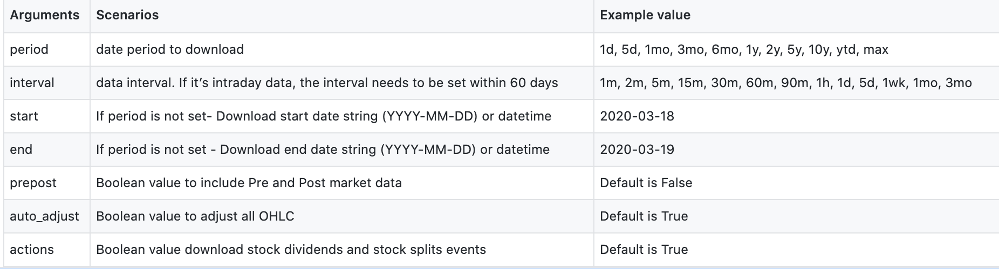

In [58]:
SP_hist.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Period
Date,,,,,,,,
1927-12-30,17.66,17.66,17.66,17.66,0,0,0,1927-12-30
1928-01-03,17.76,17.76,17.76,17.76,0,0,0,1928-01-03
1928-01-04,17.72,17.72,17.72,17.72,0,0,0,1928-01-04
1928-01-05,17.55,17.55,17.55,17.55,0,0,0,1928-01-05
1928-01-06,17.66,17.66,17.66,17.66,0,0,0,1928-01-06


In [59]:
fig = go.Figure(data=[go.Candlestick(x=SP_hist['Period'], 
                open=SP_hist['Open'],
                high=SP_hist['High'],
                low=SP_hist['Low'],
                close=SP_hist['Close'])])

slider(fig)
# Edit the layout
fig.update_layout(title='Daily S&P 500',
                   xaxis_title='Period',
                   )
initial_range1 = [
    max(SP_hist['Period'])-MonthEnd(60), max(SP_hist['Period'])
]

fig['layout']['xaxis'].update(range=initial_range1)

fig.show()

In [60]:
# Mthly S&P data
Mthly_SP_hist=SP_hist.drop(columns=['Open','High','Low','Volume','Dividends','Stock Splits'])
Mthly_SP_hist=quandl_data(Mthly_SP_hist,'Close','M')
Mthly_SP_hist

,Date,Close,Diff,Diff_ind,pct_change
0,1928-01-31,17.520000,-0.140000,0,NaN
1,1928-02-29,17.324211,-0.195789,0,-0.011175
2,1928-03-31,18.233182,0.908971,1,0.052468
3,1928-04-30,19.371000,1.137818,1,0.062404
4,1928-05-31,20.004091,0.633091,1,0.032682
...,...,...,...,...,...
1105,2020-02-29,3277.314211,-0.888647,0,-0.000271
1106,2020-03-31,2652.393636,-624.920574,0,-0.190681
1107,2020-04-30,2761.975238,109.581602,1,0.041314
1108,2020-05-31,2919.608500,157.633262,1,0.057073


In [61]:
# Quarterly S&P data
Qtrly_SP_hist=SP_hist.drop(columns=['Open','High','Low','Volume','Dividends','Stock Splits'])
Qtrly_SP_hist=quandl_data(Qtrly_SP_hist,'Close','Q')
Qtrly_SP_hist

,Date,Close,Diff,Diff_ind,pct_change
0,1928-03-31,17.713065,0.053065,1,NaN
1,1928-06-30,19.463492,1.750428,1,0.098821
2,1928-09-30,19.996984,0.533492,1,0.027410
3,1928-12-31,22.581935,2.584951,1,0.129267
4,1929-03-31,25.081833,2.499898,1,0.110703
...,...,...,...,...,...
365,2019-06-30,2882.327778,161.323352,1,0.059288
366,2019-09-30,2957.836406,75.508628,1,0.026197
367,2019-12-31,3082.755625,124.919219,1,0.042233
368,2020-03-31,3055.869194,-26.886431,0,-0.008722


In [62]:
fig = px.line(Mthly_SP_hist, x='Date', y='pct_change',title='Pct_Change in Mthly S&P 500 Index')
slider(fig)
fig1 = px.line(Qtrly_SP_hist, x='Date', y='pct_change',title='Pct_Change in Qtrly S&P 500 Index')
slider(fig1)
fig.show()
fig1.show()

### VIX 

- The CBOE Volatility Index, is a real-time market index representing the market's expectations for volatility over the coming 30 days.
- Investors use the VIX to measure the level of risk, fear, or stress in the market when making investment decisions.
- Traders can also trade the VIX using a variety of options and exchange-traded products, or use VIX values to price derivatives.
- http://www.cboe.com/products/vix-index-volatility/vix-options-and-futures/vix-index/vix-historical-data

In [63]:
VIX = yf.Ticker("^VIX")
VIX = VIX.history(period="max")
VIX.reset_index()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1990-01-02,17.24,17.24,17.24,17.24,0,0,0
1,1990-01-03,18.19,18.19,18.19,18.19,0,0,0
2,1990-01-04,19.22,19.22,19.22,19.22,0,0,0
3,1990-01-05,20.11,20.11,20.11,20.11,0,0,0
4,1990-01-08,20.26,20.26,20.26,20.26,0,0,0
...,...,...,...,...,...,...,...,...
7673,2020-06-16,34.28,37.45,31.73,33.67,0,0,0
7674,2020-06-17,33.28,35.17,32.25,33.47,0,0,0
7675,2020-06-18,33.83,36.25,32.24,32.94,0,0,0
7676,2020-06-19,32.07,35.12,30.40,35.12,0,0,0


In [64]:
VIX.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits'], dtype='object')

In [65]:
VIX_plot=VIX.reset_index()
fig = px.line(VIX_plot, x='Date', y='Close',title='Daily VIX Index')
slider(fig)
fig.show()

In [66]:
# Mthly VIX data
Mthly_VIX=VIX.drop(columns=['Open','High','Low','Volume','Dividends','Stock Splits'])
Mthly_VIX=quandl_data(Mthly_VIX,'Close','M')
Mthly_VIX

,Date,Close,Diff,Diff_ind,pct_change
0,1990-02-28,23.262632,-0.084641,0,NaN
1,1990-03-31,20.062273,-3.200359,0,-0.137575
2,1990-04-30,21.403500,1.341227,1,0.066853
3,1990-05-31,18.097727,-3.305773,0,-0.154450
4,1990-06-30,16.822381,-1.275346,0,-0.070470
...,...,...,...,...,...
360,2020-02-29,19.628947,5.687995,1,0.408006
361,2020-03-31,57.736818,38.107871,1,1.941412
362,2020-04-30,41.453810,-16.283009,0,-0.282021
363,2020-05-31,30.897000,-10.556810,0,-0.254664


In [67]:
bar_chart(Mthly_VIX,'Date','Diff',{'Diff':"Monthly Change in VIX"},'Diff_ind',[(0,"red"), (1,"green")],'Monthy Change in VIX')

In [68]:
Q_VIX=VIX.drop(columns=['Open','High','Low','Volume','Dividends','Stock Splits'])
Q_VIX=quandl_data(Q_VIX,'Close','Q')
Q_VIX

,Date,Close,Diff,Diff_ind,pct_change
0,1990-06-30,18.722063,-3.452540,0,NaN
1,1990-09-30,25.195556,6.473492,1,0.345768
2,1990-12-31,26.113281,0.917726,1,0.036424
3,1991-03-31,22.494754,-3.618527,0,-0.138570
4,1991-06-30,17.147031,-5.347723,0,-0.237732
...,...,...,...,...,...
116,2019-06-30,15.183016,-1.286984,0,-0.078141
117,2019-09-30,15.960156,0.777140,1,0.051185
118,2019-12-31,13.985781,-1.974375,0,-0.123706
119,2020-03-31,31.224516,17.238735,1,1.232590


#### Net exports of goods and services

In [69]:
export=quandl.get("FRED/NETEXP", authtoken="AGJ1dWxnkuFZxZzkGSDg")

In [70]:
export.tail()

,Value
Date,
2019-01-01,-633.848
2019-04-01,-662.660
2019-07-01,-653.032
2019-10-01,-577.867
2020-01-01,-526.154


In [71]:
q_export=quandl_data(export,'Value','Q')
q_export['pct_change']=q_export['pct_change']*-1
q_export.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1947-06-30,11.294,0.419,1,NaN
1,1947-09-30,11.770,0.476,1,-0.042146
2,1947-12-31,9.289,-2.481,0,0.210790
3,1948-03-31,7.293,-1.996,0,0.214878
4,1948-06-30,5.205,-2.088,0,0.286302


In [72]:
fig1 = px.bar(q_export, x='Date', y='Value',labels={'Value':"Quarterly Change in USD Billions"},title='Quarterly Change in Export')
slider(fig1)
fig1.update_layout(coloraxis_showscale=False)
fig1.show()

#### Interest Rate Spread between 10 year Treasury yield and federal funds rate
- A treasury bond is a certificate representing a loan to the federal government that matures in more than 10 years.
- Since they are backed by the U.S. government, they are seen as a safe investment, particularly relative to stocks and other securities.
- Federal funds rate is the target interest rate set by the FOMC at which commercial banks borrow and lend their excess reserves to each other overnight.
- FOMC sets a target federal funds rate eight times a year, based on prevailing economic conditions.
- The federal funds rate can influence short-term rates on consumer loans and credit cards as well as impact the stoc

In [73]:
spread=quandl.get("FRED/T10YFFM", authtoken="AGJ1dWxnkuFZxZzkGSDg")
spread=quandl_data(spread,'Value','M')
spread.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1954-08-31,1.14,-0.36,0,NaN
1,1954-09-30,1.32,0.18,1,0.157895
2,1954-10-31,1.58,0.26,1,0.196970
3,1954-11-30,1.65,0.07,1,0.044304
4,1954-12-31,1.23,-0.42,0,-0.254545


In [74]:
bar_chart(spread,'Date','Value',{'Value':'Monthly'},'Value','RdYlGn','Monthly Interest Rate Spread between 10 year Treasury yield and federal funds rate')

In [75]:
qspread=quandl.get("FRED/T10YFFM", authtoken="AGJ1dWxnkuFZxZzkGSDg")
qspread=quandl_data(qspread,'Value','Q')
qspread.head()

,Date,Value,Diff,Diff_ind,pct_change
0,1954-12-31,1.486667,0.166667,1,NaN
1,1955-03-31,1.303333,-0.183333,0,-0.123318
2,1955-06-30,1.263333,-0.040000,0,-0.030691
3,1955-09-30,1.006667,-0.256667,0,-0.203166
4,1955-12-31,0.553333,-0.453333,0,-0.450331


In [76]:
qspread[['Date',"Value"]]

,Date,Value
0,1954-12-31,1.486667
1,1955-03-31,1.303333
2,1955-06-30,1.263333
3,1955-09-30,1.006667
4,1955-12-31,0.553333
...,...,...
258,2019-06-30,-0.063333
259,2019-09-30,-0.393333
260,2019-12-31,0.150000
261,2020-03-31,0.123333


#### Real US GDP
- Real gross domestic product (GDP) is an inflation-adjusted measure that reflects the value of all goods and services produced by an economy in a given year (expressed in base-year prices) and is often referred to as "constant-price," "inflation-corrected", or "constant dollar" GDP.

In [91]:
US_GDP_real = quandl.get("FRED/GDPC1").reset_index()
US_GDP_real_pct_change=quandl.get("FRED/A191RL1Q225SBEA").reset_index()
US_GDP=pd.merge(US_GDP_real,US_GDP_real_pct_change,on='Date')
US_GDP.columns=['Date','Real_GDP','pct_change']
#US_GDP['pct_change']=US_GDP['pct_change']/100
US_GDP['GDP_Diff']= US_GDP['Real_GDP'].diff()
US_GDP['Target']=(US_GDP['pct_change']>=0).astype(int)
US_GDP['Qtr'] = pd.to_datetime(US_GDP['Date'], format="%Y-%m-%d") + MonthEnd(3)

In [92]:
US_GDP.tail()

,Date,Real_GDP,pct_change,GDP_Diff,Target,Qtr
287,2019-01-01,18927.281,3.1,143.733,1,2019-03-31
288,2019-04-01,19021.860,2.0,94.579,1,2019-06-30
289,2019-07-01,19121.112,2.1,99.252,1,2019-09-30
290,2019-10-01,19221.970,2.1,100.858,1,2019-12-31
291,2020-01-01,18974.702,-5.0,-247.268,0,2020-03-31


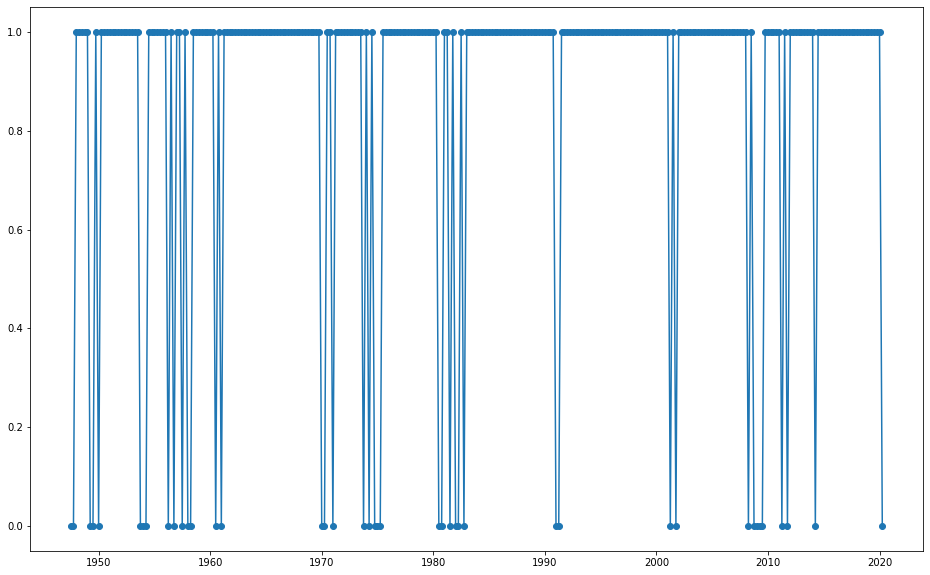

In [93]:
plt.figure(figsize=(16,10))
plt.plot(US_GDP['Qtr'],US_GDP['Target'],marker='o')

In [94]:
US_GDP['Target'].value_counts(normalize=True)

1    0.856164
0    0.143836
Name: Target, dtype: float64

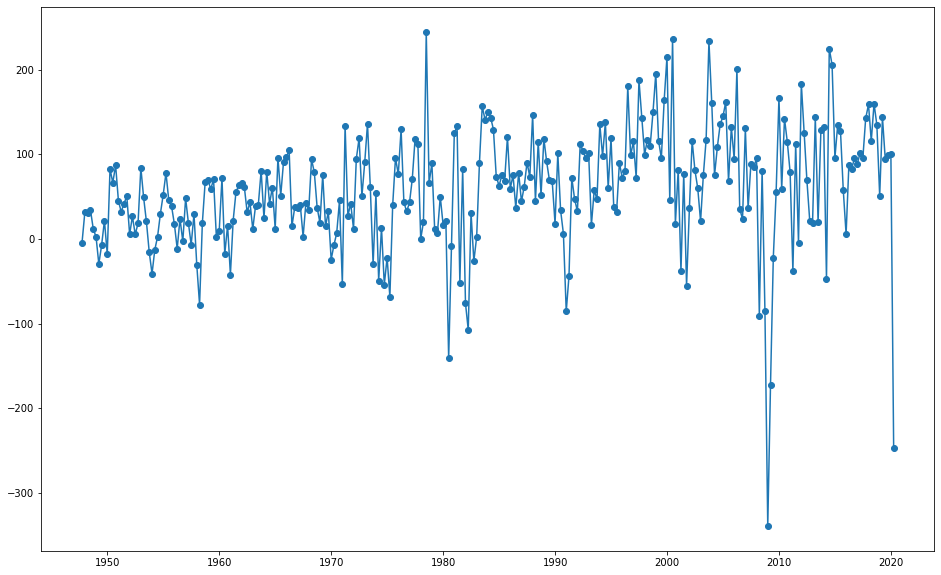

In [95]:
plt.figure(figsize=(16,10))
plt.plot(US_GDP['Qtr'],US_GDP['GDP_Diff'],marker='o')

In [96]:
(US_GDP['GDP_Diff']>0).astype(int).value_counts(normalize=True)

1    0.856164
0    0.143836
Name: GDP_Diff, dtype: float64

In [97]:
bar_chart(US_GDP,'Date','pct_change',{'Diff':'Quarterly'},'Target','RdYlGn','Quarterly US GDP Diff in %')

#### Observation:

- From the above quarterly US GDP, we can see the recessions that tooked place in US.
- Recession = 2 consecutive quarters of negative GDP. 
    eg. 
    * 1973-1974 (The Oil Crisis Recession), 
    * 1980-1982 (Iran/Energy Crisis Recession), 
    * 1991 (weak US economy + oil price shock-Iraqi invasion of Kuwait ), 
    * 2008-2009 (Global Financial crisis)
    * (https://www.investopedia.com/articles/economics/08/past-recessions.asp)

### Data Merging

In [84]:
# Qtrly data
df_qtr=pd.merge(qtrly_ism[['Date','PMI']],qtrly_nmi[['Date','Index']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Index": "NMI"})
df_qtr=pd.merge(df_qtr,q_consumer_sen[['Date','Index']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Index": "Consumer_sen"})
df_qtr=pd.merge(df_qtr,q_building_permits[['Date','Value']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Value": "building_permits"})
df_qtr=pd.merge(df_qtr,q_unemployment[['Date','Value']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Value": "Unemployment"})
df_qtr=pd.merge(df_qtr,q_non_farm[['Date','Value']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Value": "Non_Farm"})
df_qtr=pd.merge(df_qtr,q_initial_claims[['Date','Value']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Value": "Initial_Claims"})
df_qtr=pd.merge(df_qtr,q_continuing_claims[['Date','Value']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Value": "Continuing_Claims"})
df_qtr=pd.merge(df_qtr,Qtrly_SP_hist[['Date','Close']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Close": "SnP500"})
df_qtr=pd.merge(df_qtr,Q_VIX[['Date','Close']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Close": "VIX"})
df_qtr=pd.merge(df_qtr,q_export[['Date','Value']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Value": "Net_Export"})
df_qtr=pd.merge(df_qtr,qspread[['Date','Value']],on='Date',how='left')
df_qtr=df_qtr.rename(columns={"Value": "int_spread"})
#df_qtr=pd.merge(df_qtr,US_GDP[['Qtr','Real_GDP','pct_change','Target']],left_on='Date',right_on='Qtr',how='left')
df_qtr=pd.merge(df_qtr,US_GDP[['Qtr','Real_GDP']],left_on='Date',right_on='Qtr',how='left')
#df_qtr=df_qtr.rename(columns={"pct_change": "GDP Growth Rate"})
df_qtr.drop('Qtr',axis=1,inplace=True)

In [98]:
# Monthly data
df=pd.merge(mthly_ism[['Date','PMI']],mthly_nmi[['Date','Index']],on='Date',how='left')
df=df.rename(columns={"Index": "NMI"})
df=pd.merge(df,m_consumer_sen[['Date','Index']],on='Date',how='left')
df=df.rename(columns={"Index": "Consumer_sen"})
df=pd.merge(df,m_building_permits[['Date','Value']],on='Date',how='left')
df=df.rename(columns={"Value": "building_permits"})
df=pd.merge(df,m_unemployment[['Date','Value']],on='Date',how='left')
df=df.rename(columns={"Value": "Unemployment"})
df=pd.merge(df,non_farm[['Date','Value']],on='Date',how='left')
df=df.rename(columns={"Value": "Non_Farm"})
df=pd.merge(df,initial_claims[['Date','Value']],on='Date',how='left')
df=df.rename(columns={"Value": "Initial_Claims"})
df=pd.merge(df,continuing_claims[['Date','Value']],on='Date',how='left')
df=df.rename(columns={"Value": "Continuing_Claims"})
df=pd.merge(df,Mthly_SP_hist[['Date','Close']],on='Date',how='left')
df=df.rename(columns={"Close": "SnP500"})
df=pd.merge(df,Mthly_VIX[['Date','Close']],on='Date',how='left')
df=df.rename(columns={"Close": "VIX"})
df=pd.merge(df,q_export[['Date','Value']],on='Date',how='left')
df=df.rename(columns={"Value": "Net_Export"})
df=pd.merge(df,spread[['Date','Value']],on='Date',how='left')
df=df.rename(columns={"Value": "int_spread"})
#df=pd.merge(df,US_GDP[['Qtr','Real_GDP','pct_change','Target']],left_on='Date',right_on='Qtr',how='left')
df=pd.merge(df,US_GDP[['Qtr','Real_GDP','pct_change']],left_on='Date',right_on='Qtr',how='left')
df=df.rename(columns={"pct_change": "GDP_Growth_Rate"})
df.drop('Qtr',axis=1,inplace=True)

In [99]:
df.shape

(868, 15)

In [100]:
df.head()

,Date,PMI,NMI,Consumer_sen,building_permits,Unemployment,Non_Farm,Initial_Claims,Continuing_Claims,SnP500,VIX,Net_Export,int_spread,Real_GDP,GDP_Growth_Rate
0,1948-02-29,50.2,NaN,NaN,NaN,2328.0,44533.0,NaN,NaN,14.096667,NaN,NaN,NaN,NaN,NaN
1,1948-03-31,43.3,NaN,NaN,NaN,2399.0,44683.0,NaN,NaN,14.284545,NaN,7.293,NaN,2086.017,6.2
2,1948-04-30,45.4,NaN,NaN,NaN,2386.0,44379.0,NaN,NaN,15.399091,NaN,NaN,NaN,NaN,NaN
3,1948-05-31,49.5,NaN,NaN,NaN,2118.0,44796.0,NaN,NaN,16.171500,NaN,NaN,NaN,NaN,NaN
4,1948-06-30,53.0,NaN,NaN,NaN,2214.0,45034.0,NaN,NaN,16.824545,NaN,5.205,NaN,2120.450,6.8


In [101]:
df_qtr.shape

(289, 14)

In [102]:
df_qtr.head()

,Date,PMI,NMI,Consumer_sen,building_permits,Unemployment,Non_Farm,Initial_Claims,Continuing_Claims,SnP500,VIX,Net_Export,int_spread,Real_GDP
0,1948-06-30,49.300000,NaN,NaN,NaN,2239.333333,44736.333333,NaN,NaN,16.130469,NaN,5.205,NaN,2120.450
1,1948-09-30,45.200000,NaN,NaN,NaN,2288.333333,45210.666667,NaN,NaN,16.037969,NaN,4.949,NaN,2132.598
2,1948-12-31,41.533333,NaN,NaN,NaN,2324.333333,45156.333333,NaN,NaN,15.545000,NaN,4.501,NaN,2134.981
3,1949-03-31,32.900000,NaN,NaN,NaN,2825.000000,44468.333333,NaN,NaN,15.009841,NaN,6.478,NaN,2105.562
4,1949-06-30,33.233333,NaN,NaN,NaN,3581.000000,43986.333333,NaN,NaN,14.526508,NaN,6.283,NaN,2098.380


In [103]:
# Save dataframe to csv files
df.to_csv('Data/US.csv')
df_qtr.to_csv('Data/Qtr_US.csv')